<a href="https://colab.research.google.com/github/lukemccarvill/earthwatch-cnn/blob/segmentation/src/segmentation_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [1]:
# quick memory check
!free -h
# python-level
import psutil
vm = psutil.virtual_memory()
print(f"Total: {vm.total/1e9:.2f} GB, Available: {vm.available/1e9:.2f} GB, Used: {vm.used/1e9:.2f} GB")


               total        used        free      shared  buff/cache   available
Mem:            12Gi       1.6Gi       7.7Gi       2.0Mi       3.4Gi        10Gi
Swap:             0B          0B          0B
Total: 13.61 GB, Available: 11.55 GB, Used: 1.72 GB


In [2]:
# copy to the VM for faster IO (optional)
!cp -r /content/drive/MyDrive/Earthwatch_project/water_v2 /content/water_v2
!ls -la /content/water_v2

^C
total 12
drwx------ 3 root root 4096 Nov 27 12:30 .
drwxr-xr-x 1 root root 4096 Nov 27 12:30 ..
drwx------ 4 root root 4096 Nov 27 12:30 Annotations


In [3]:
# 1) Confirm Drive is mounted and where
from google.colab import drive
drive.mount('/content/drive', force_remount=False)   # shows status if already mounted
!ls -ld /content/drive /content/drive/MyDrive


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
drwx------ 5 root root 4096 Nov 27 13:28 /content/drive
drwx------ 2 root root 4096 Nov 27 13:28 /content/drive/MyDrive


In [41]:
# common
import os
import keras
from tqdm import tqdm
from glob import glob
import tensorflow as tf
from numpy import zeros
from numpy.random import randint
from PIL import Image, ImageOps
import PIL.ExifTags

# Data
from tensorflow.image import resize
from keras.preprocessing.image import load_img, img_to_array

# Data Viz
import matplotlib.pyplot as plt

# Model
from keras.layers import add
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import multiply
from keras.layers import concatenate
from keras.layers import Conv2DTranspose
from keras.layers import MaxPool2D
from keras.layers import UpSampling2D
from keras.layers import BatchNormalization
from keras.layers import Dropout

# Model Functions
from keras.models import Model
from tensorflow.keras.utils import plot_model
from keras.callbacks import Callback, ModelCheckpoint

In [54]:
def load_image(path):
    img = load_img(path)
    img = ImageOps.exif_transpose(img)
    img = resize(img_to_array(img)/255., (224,224))
    return img

In [55]:
image_path = "/content/drive/MyDrive/Earthwatch_project/water_v2/JPEGImages/ADE20K"
total_images = len(os.listdir(image_path))
print(f"Total Number of Images : {total_images}")

Total Number of Images : 3776


In [7]:
all_image_paths = sorted(glob(image_path + "/*.png"))

In [56]:
def load_data(paths):
    images = zeros(shape=(len(paths), 224,224,3))
    masks = zeros(shape=(len(paths), 224,224,3))
    for i, path in tqdm(enumerate(paths), desc="Loading"):

        image = load_image(path)
        images[i] = image
        mask_path = path.replace("JPEGImages", "Annotations")
        if not os.path.exists(mask_path):
            print("Mask missing:", mask_path)
            continue
        mask = load_image(mask_path)
        masks[i] = mask
    return images, masks

In [9]:
train_paths = all_image_paths[:800]
X_train, y_train = load_data(train_paths)

Loading: 6it [00:00, 13.31it/s]

Mask missing: /content/drive/MyDrive/Earthwatch_project/water_v2/Annotations/ADE20K/ADE_train_00000004.png
Mask missing: /content/drive/MyDrive/Earthwatch_project/water_v2/Annotations/ADE20K/ADE_train_00000191.png
Mask missing: /content/drive/MyDrive/Earthwatch_project/water_v2/Annotations/ADE20K/ADE_train_00000407.png
Mask missing: /content/drive/MyDrive/Earthwatch_project/water_v2/Annotations/ADE20K/ADE_train_00000555.png
Mask missing: /content/drive/MyDrive/Earthwatch_project/water_v2/Annotations/ADE20K/ADE_train_00000556.png


Loading: 800it [01:06, 12.11it/s]


In [10]:
val_paths = all_image_paths[800:1600]
X_val, y_val = load_data(val_paths)

Loading: 800it [00:27, 29.19it/s]


In [11]:
def show_image(image, title=None):
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

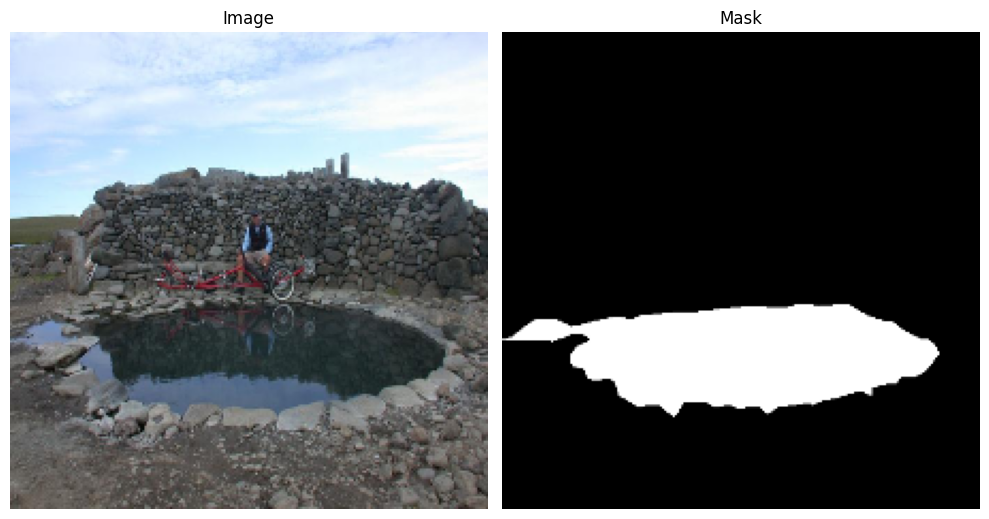

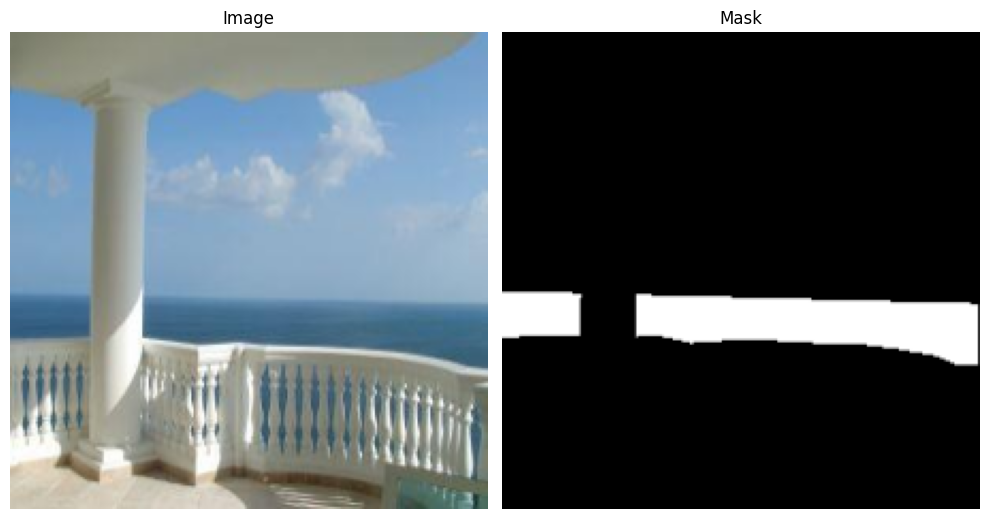

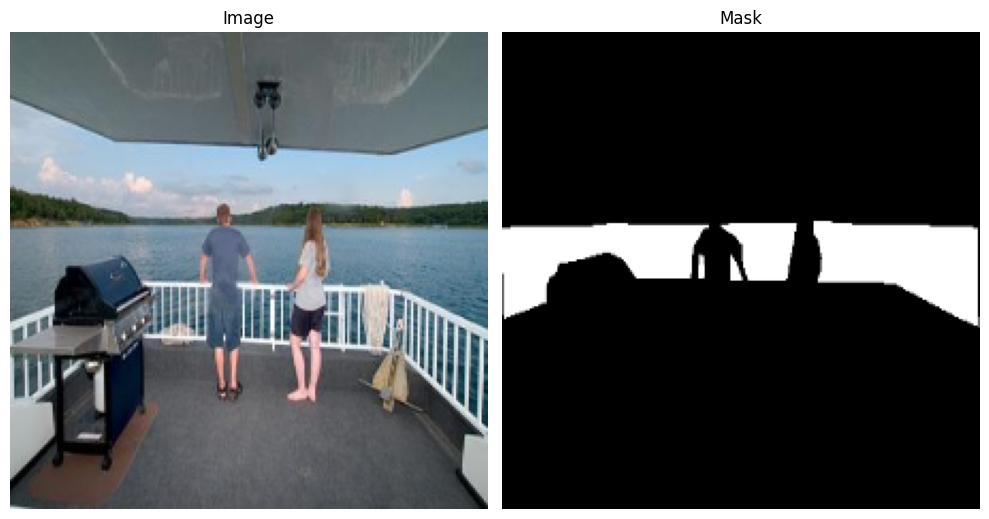

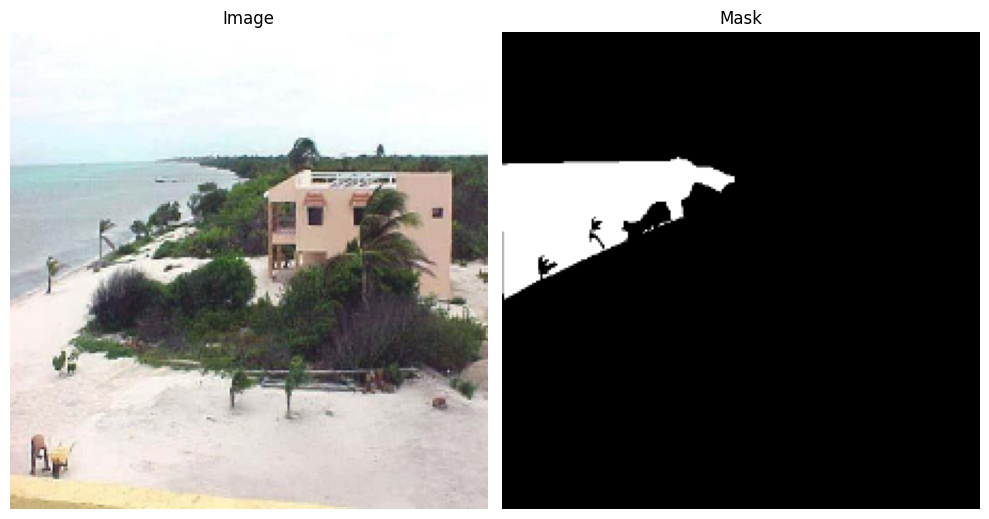

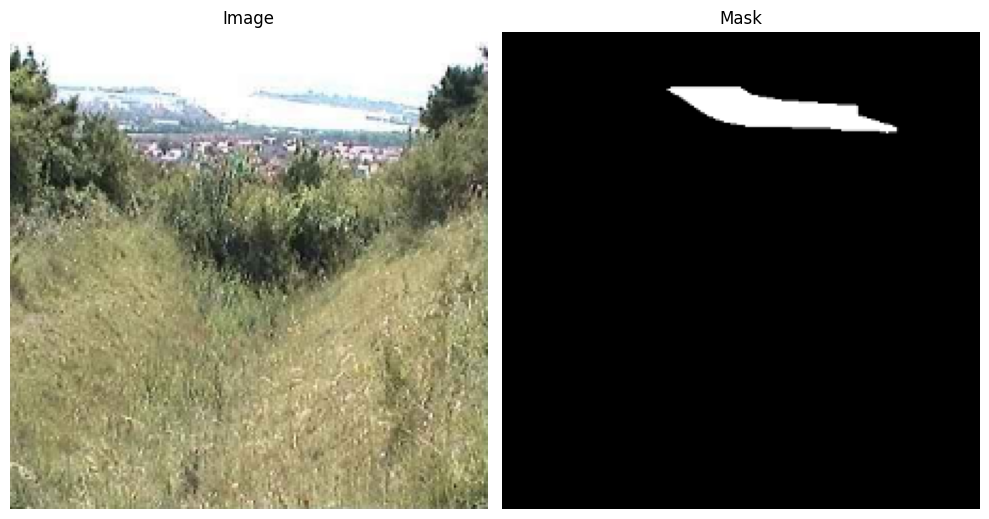

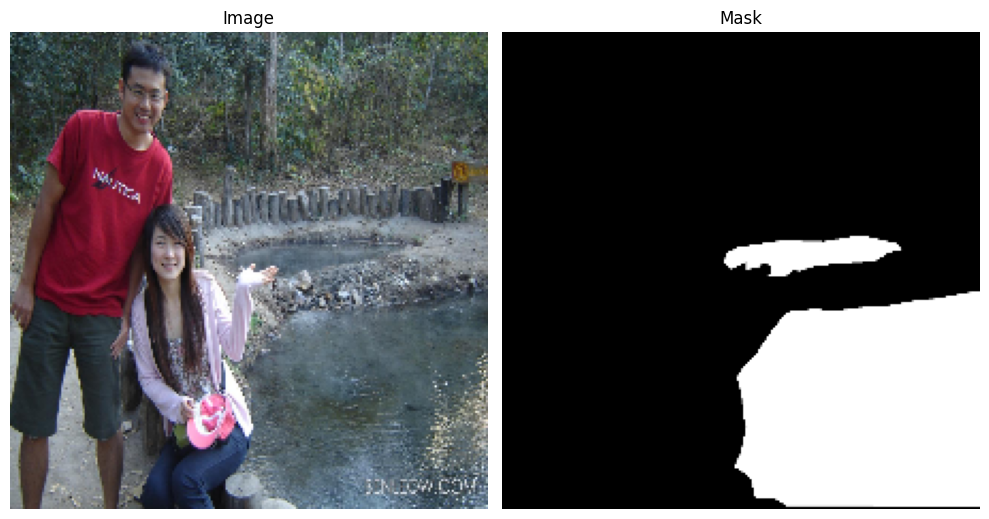

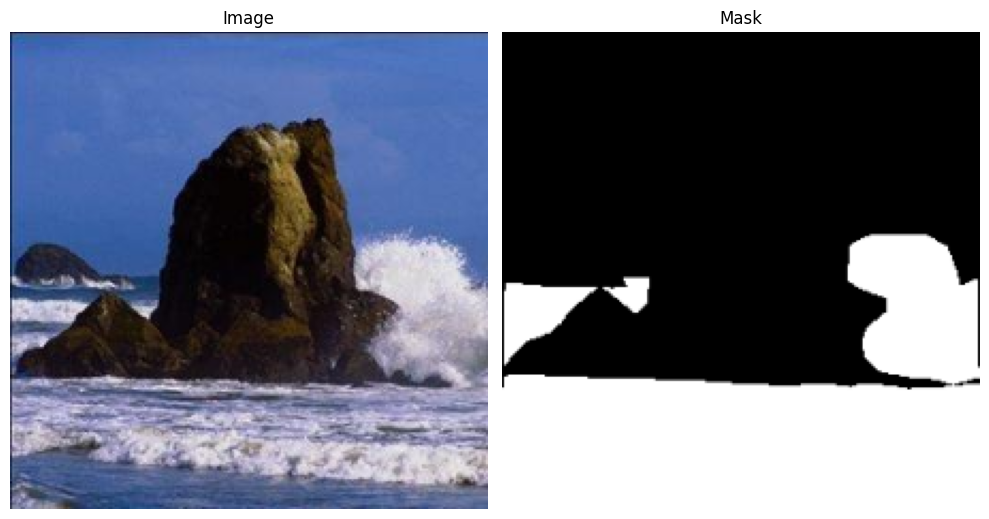

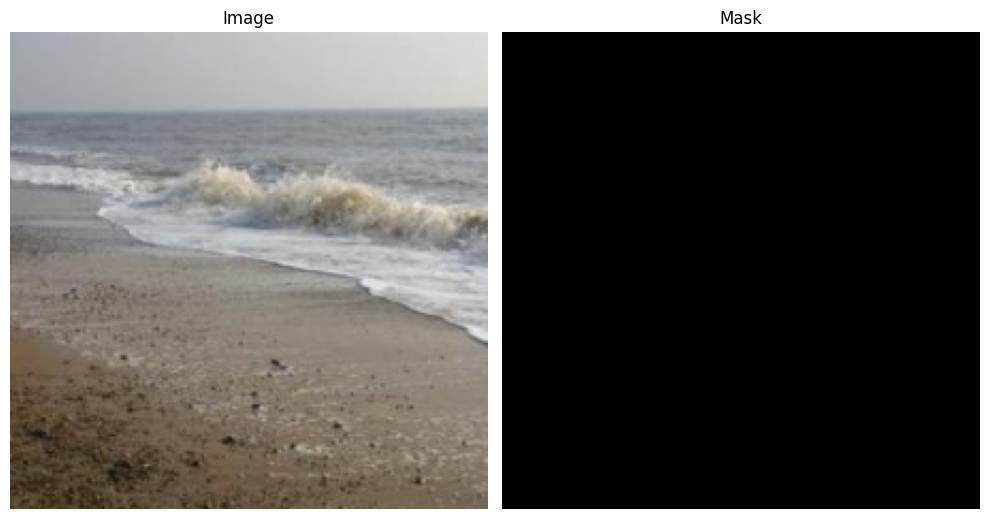

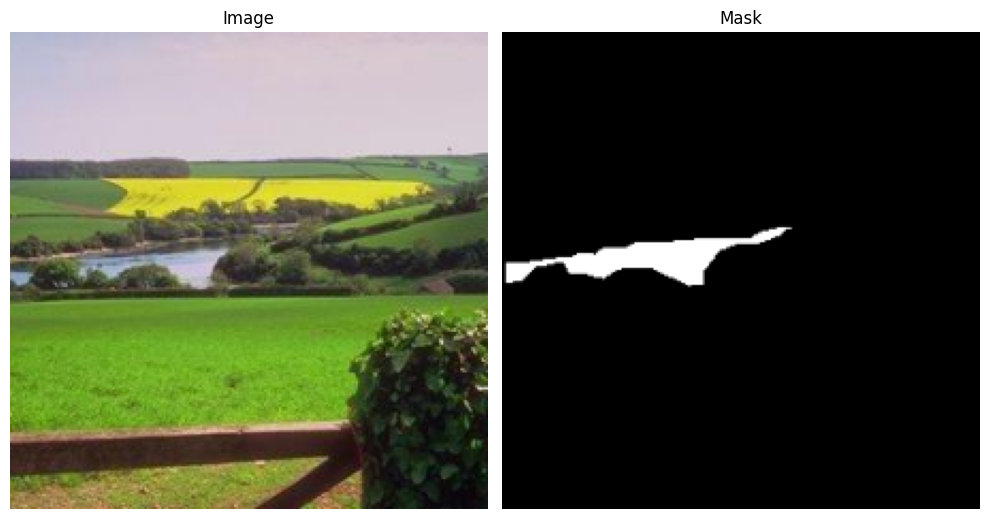

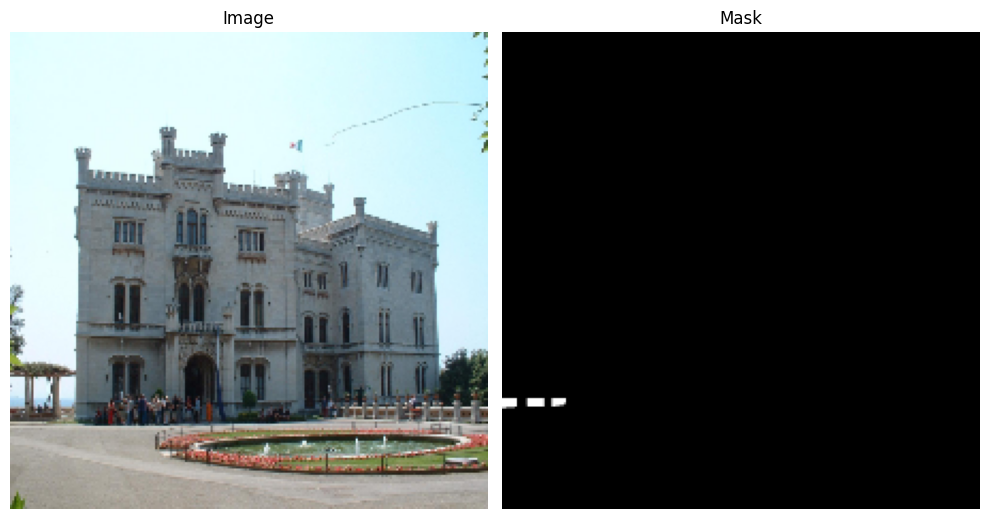

In [12]:
for i in range(10):
    id = randint(800)
    image, mask = X_train[id], y_train[id]
    plt.figure(figsize=(10,8))

    plt.subplot(1,2,1)
    show_image(image, title="Image")

    plt.subplot(1,2,2)
    show_image(mask, title="Mask")

    plt.tight_layout()
    plt.show()

In [13]:
class Encoder(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(Encoder, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.bn = BatchNormalization()
        self.c1 = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer="he_normal")
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer="he_normal")
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.bn(X)
        x = self.c1(x)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "rate":self.rate,
            "pooling":self.pooling
        }

In [14]:
class Decoder(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(Decoder, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.bn = BatchNormalization()
        self.cT = Conv2DTranspose(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer="he_normal")
        self.net = Encoder(filters, rate, pooling=False)

    def call(self, X):
        x, skip_x = X
        x = self.bn(x)
        x = self.cT(x)
        x = concatenate([x, skip_x])
        x = self.net(x)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "rate":self.rate,
        }

In [15]:
# Inputs
unet_inputs = Input(shape=(224,224,3), name="UNetInput")

# Encoder Network : Downsampling phase
p1, c1 = Encoder(64, 0.1, name="Encoder1")(unet_inputs)
p2, c2 = Encoder(128, 0.1, name="Encoder2")(p1)
p3, c3 = Encoder(256, 0.2, name="Encoder3")(p2)
p4, c4 = Encoder(512, 0.2, name="Encoder4")(p3)


# Encoding Layer : Latent Representation
e = Encoder(512, 0.3, pooling=False)(p4)

# Attention + Decoder Network : Upsampling phase.
d1 = Decoder(512, 0.2, name="Decoder1")([e, c4])
d2 = Decoder(256, 0.2, name="Decoder2")([d1, c3])
d3 = Decoder(128, 0.1, name="Decoder3")([d2, c2])
d4 = Decoder(64, 0.1, name="Decoder4")([d3, c1])

# Output
unet_out = Conv2D(3, kernel_size=3, padding='same', activation='sigmoid')(d4)

# Model
UNet = Model(
    inputs=unet_inputs,
    outputs=unet_out,
    name="AttentionUNet"
)

# Compiling
UNet.compile(
    loss='binary_crossentropy',
    optimizer='adam'
)

#It quantifies the difference between the actual class labels (0 or 1) and the predicted probabilities output by the model.
#The lower the binary cross-entropy value, the better the model’s predictions align with the true labels.

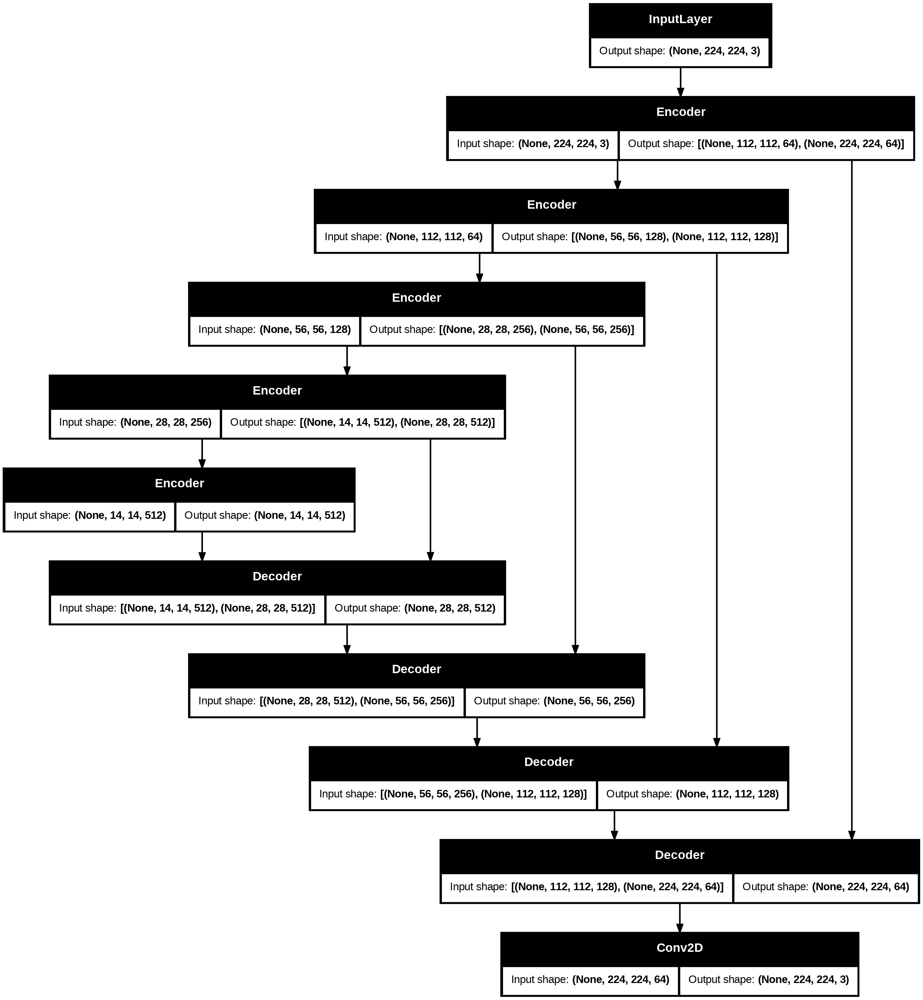

In [16]:
plot_model(UNet, "UNet-WaterBody.png", show_shapes=True)

In [17]:
BATCH_SIZE = 1
SPE = len(X_train)//BATCH_SIZE
num_workers = 0
pin_memory = False

In [18]:
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        id = randint(len(X_val))
        image = X_val[id]
        mask = y_val[id]
        pred_mask = self.model(tf.expand_dims(image,axis=0))[0]

        plt.figure(figsize=(10,8))
        plt.subplot(1,3,1)
        show_image(image, title="Original Image")

        plt.subplot(1,3,2)
        show_image(mask, title="Original Mask")

        plt.subplot(1,3,3)
        show_image(pred_mask, title="Predicted Mask")

        plt.tight_layout()
        plt.show()

In [19]:
cbs = [
    ModelCheckpoint("UNet-WaterBodySegmentation.h5", save_best_only=True),
    ShowProgress()
]

Epoch 1/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.5461

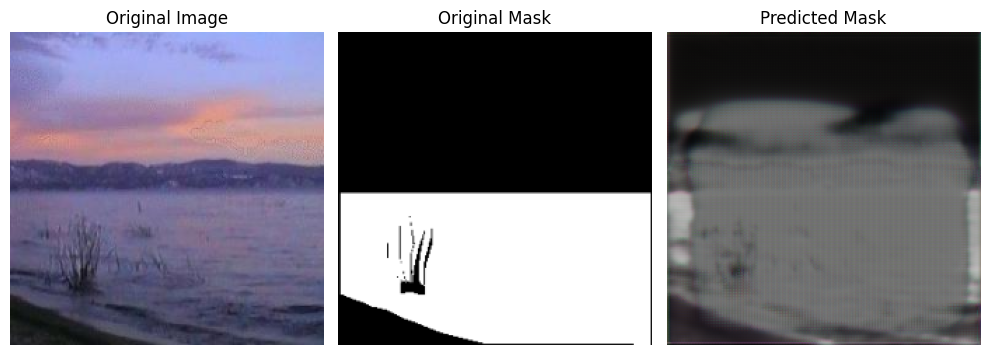

800/800 ━━━━━━━━━━━━━━━━━━━━ 142s 127ms/step - loss: 0.5460 - val_loss: 0.4979
Epoch 2/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.4182

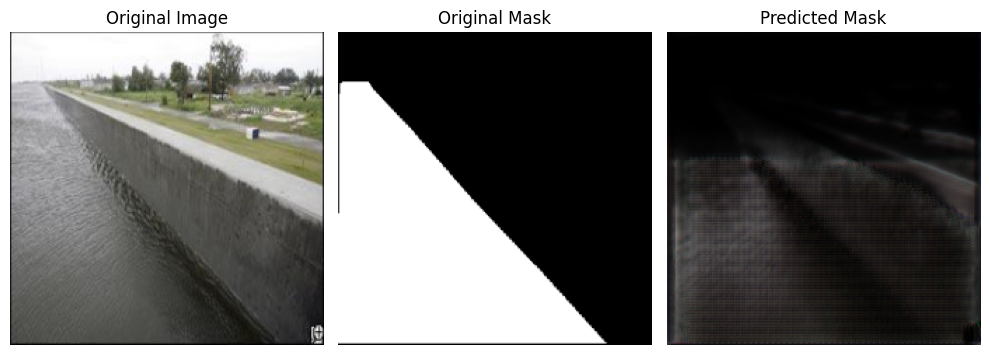

800/800 ━━━━━━━━━━━━━━━━━━━━ 95s 119ms/step - loss: 0.4182 - val_loss: 0.4914
Epoch 3/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.4104

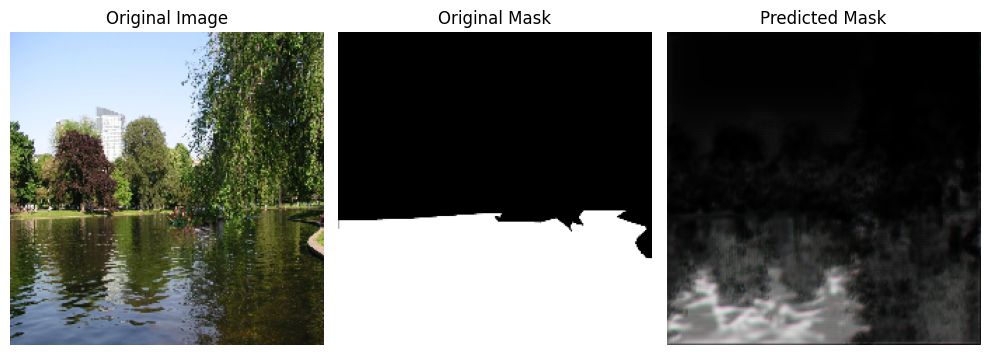

800/800 ━━━━━━━━━━━━━━━━━━━━ 99s 123ms/step - loss: 0.4104 - val_loss: 0.4263
Epoch 4/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.3881

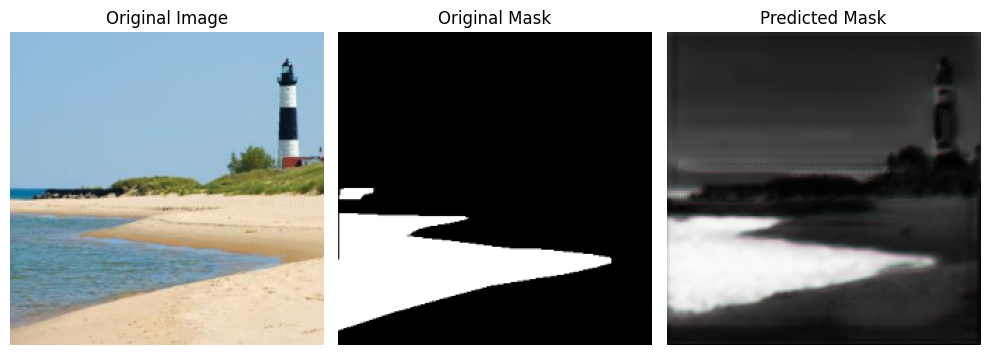

800/800 ━━━━━━━━━━━━━━━━━━━━ 92s 115ms/step - loss: 0.3881 - val_loss: 0.4727
Epoch 5/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.3764

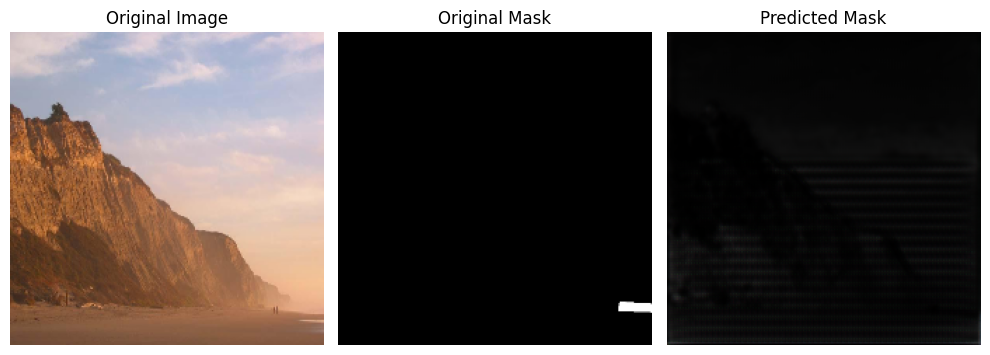

800/800 ━━━━━━━━━━━━━━━━━━━━ 95s 119ms/step - loss: 0.3764 - val_loss: 0.4236
Epoch 6/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.3558

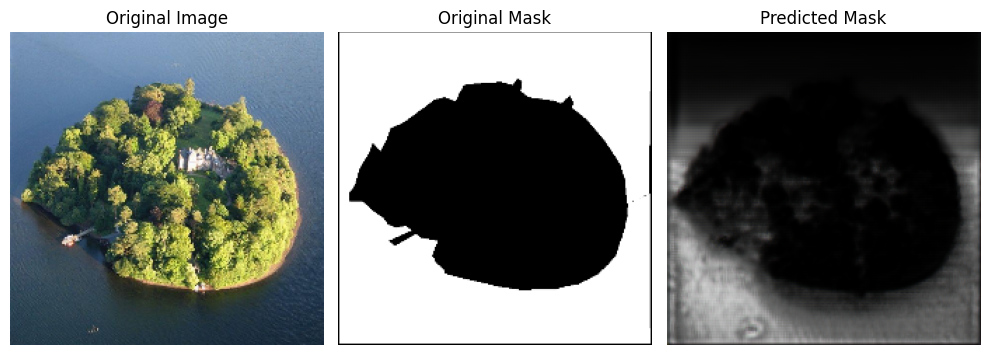

800/800 ━━━━━━━━━━━━━━━━━━━━ 93s 116ms/step - loss: 0.3559 - val_loss: 0.4520
Epoch 7/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.3613

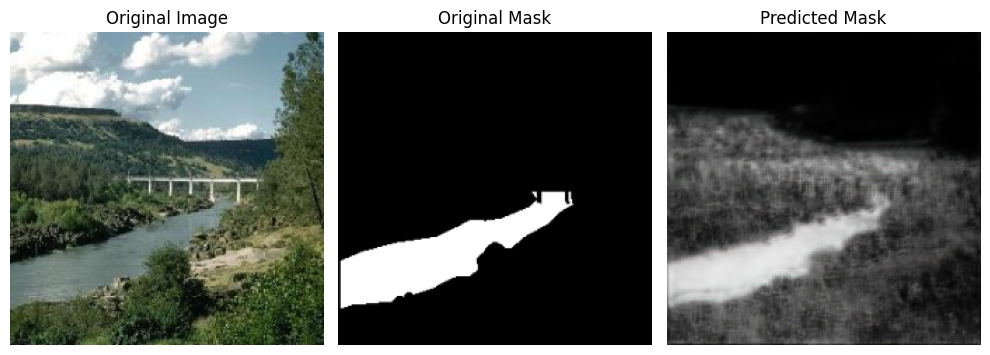

800/800 ━━━━━━━━━━━━━━━━━━━━ 92s 115ms/step - loss: 0.3613 - val_loss: 0.4282
Epoch 8/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.3406

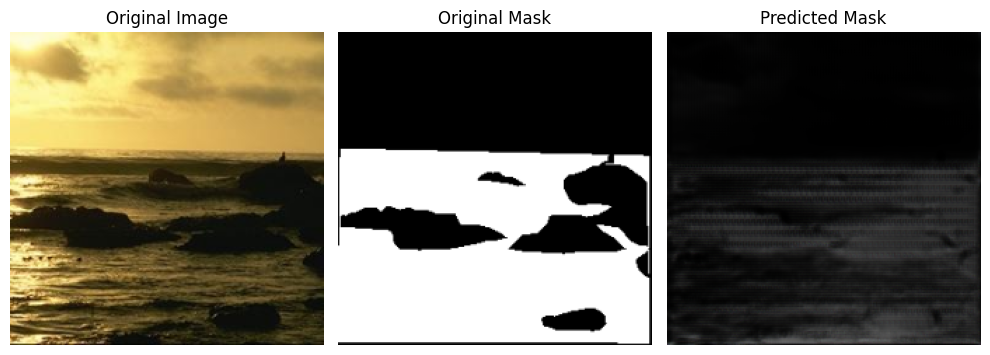

800/800 ━━━━━━━━━━━━━━━━━━━━ 91s 114ms/step - loss: 0.3406 - val_loss: 0.4505
Epoch 9/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.3147

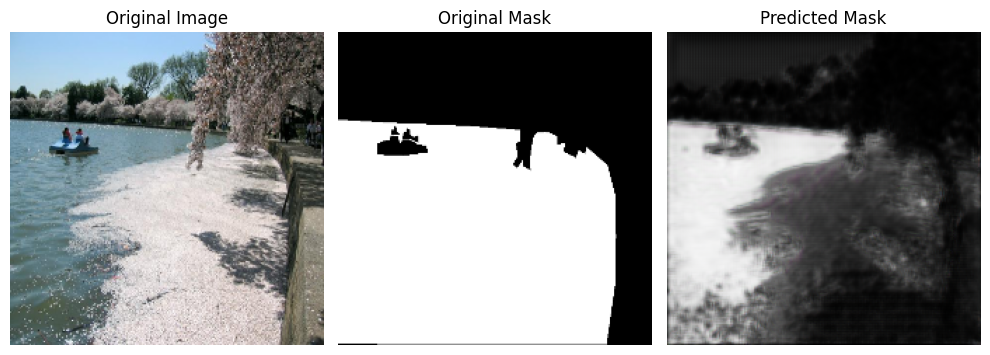

800/800 ━━━━━━━━━━━━━━━━━━━━ 92s 115ms/step - loss: 0.3148 - val_loss: 0.4679
Epoch 10/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.3263

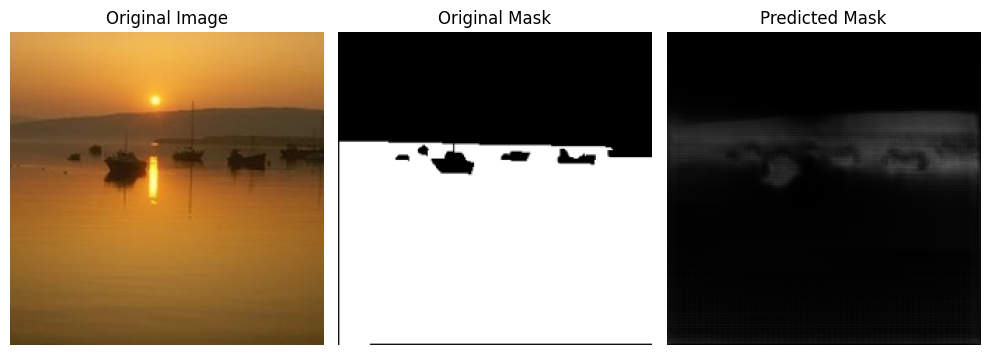

800/800 ━━━━━━━━━━━━━━━━━━━━ 91s 114ms/step - loss: 0.3263 - val_loss: 0.4365
Epoch 11/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.3354

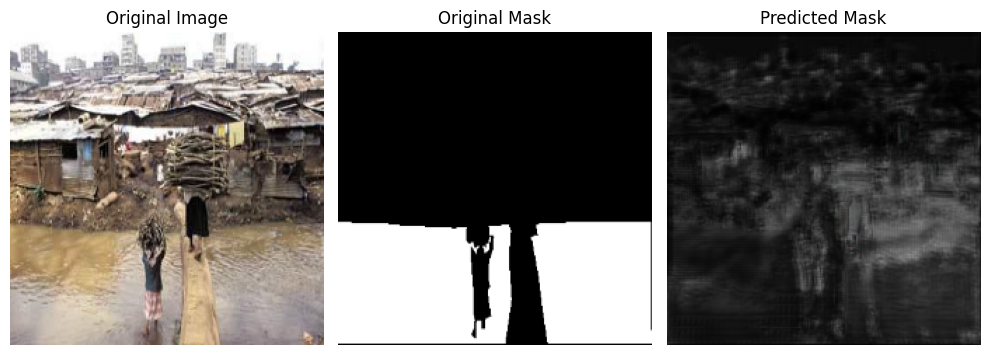

800/800 ━━━━━━━━━━━━━━━━━━━━ 99s 124ms/step - loss: 0.3354 - val_loss: 0.4135
Epoch 12/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.3156

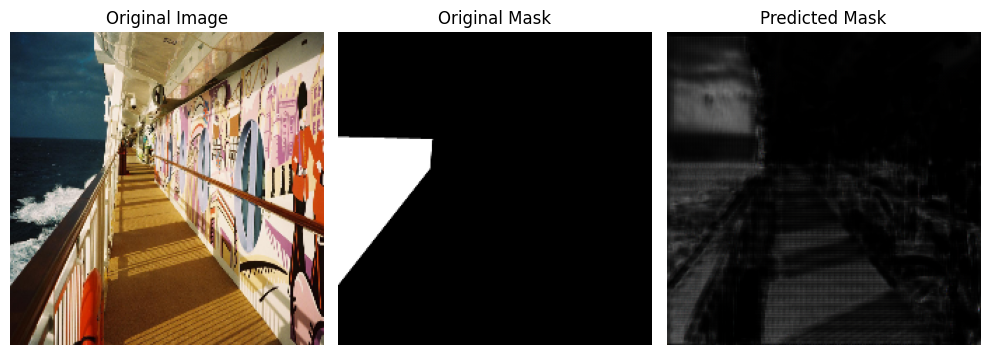

800/800 ━━━━━━━━━━━━━━━━━━━━ 91s 114ms/step - loss: 0.3156 - val_loss: 0.4201
Epoch 13/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2926

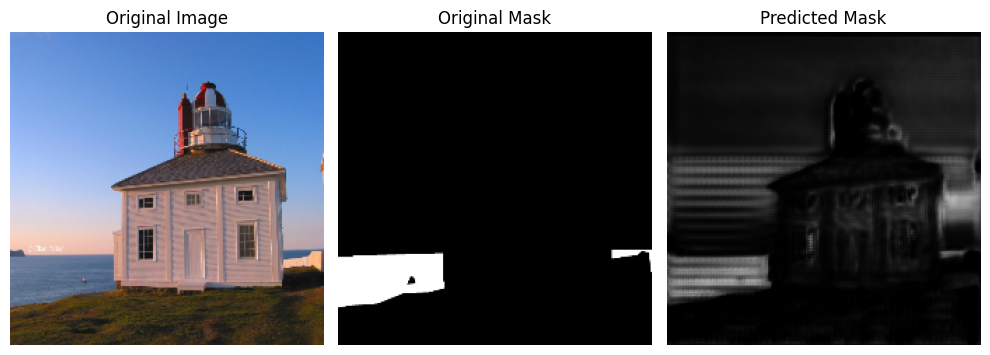

800/800 ━━━━━━━━━━━━━━━━━━━━ 92s 114ms/step - loss: 0.2926 - val_loss: 0.5801
Epoch 14/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2972

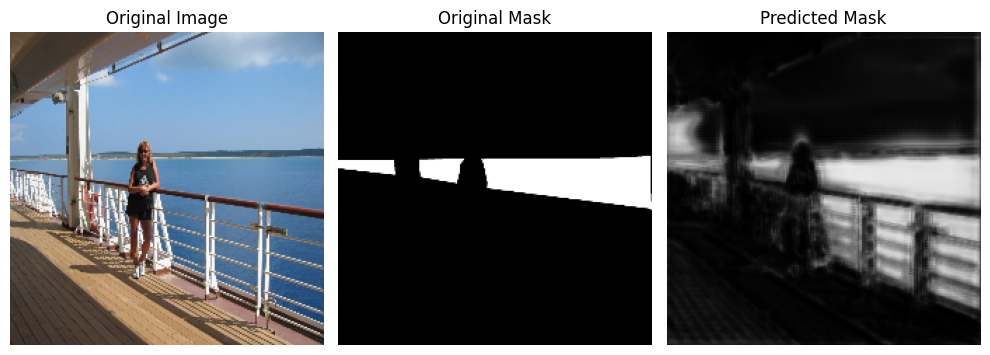

800/800 ━━━━━━━━━━━━━━━━━━━━ 140s 112ms/step - loss: 0.2972 - val_loss: 0.4740
Epoch 15/15
800/800 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.3055

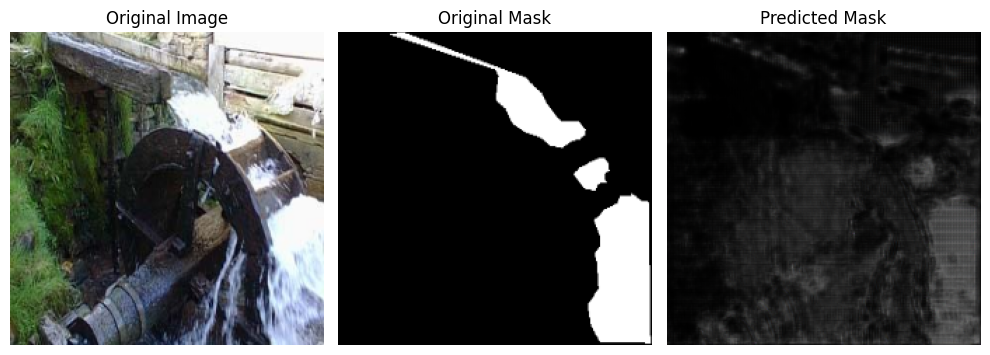

800/800 ━━━━━━━━━━━━━━━━━━━━ 102s 128ms/step - loss: 0.3055 - val_loss: 0.4080


In [20]:
import signal, sys
#signal.signal(signal.SIGALRM, lambda *_: (_ for _ in ()).throw(TimeoutError("Training timed out")))
#signal.alarm(600)  # stop cell after 10 minutes

UNet.fit(
    X_train, y_train,
    epochs=15,
    batch_size=BATCH_SIZE,
    steps_per_epoch=SPE,
    validation_data=(X_val, y_val),
    callbacks=cbs
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


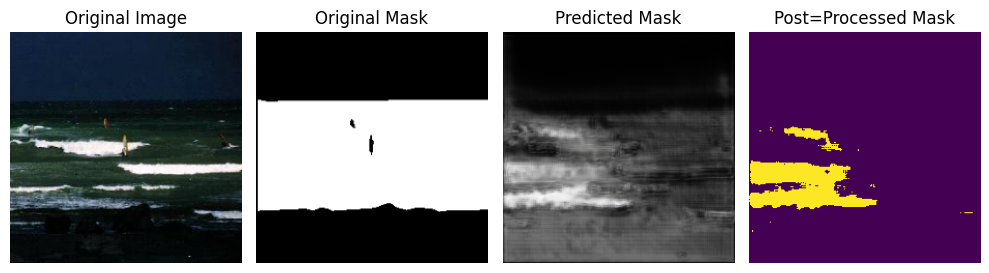

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


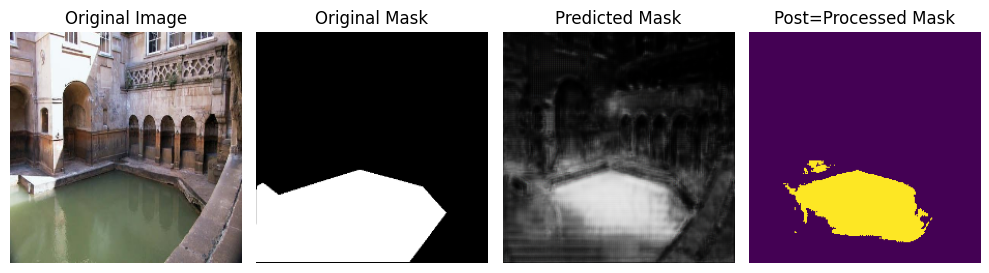

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


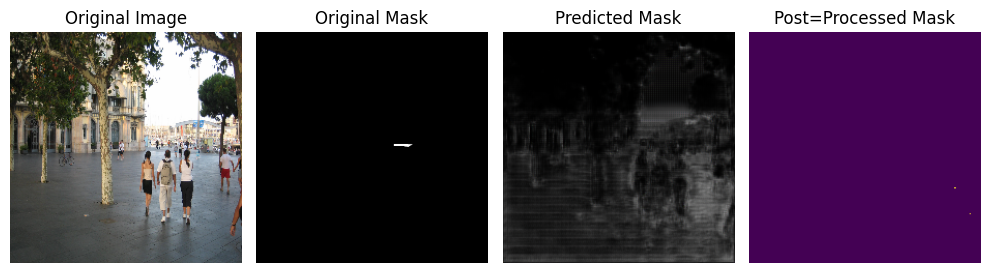

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


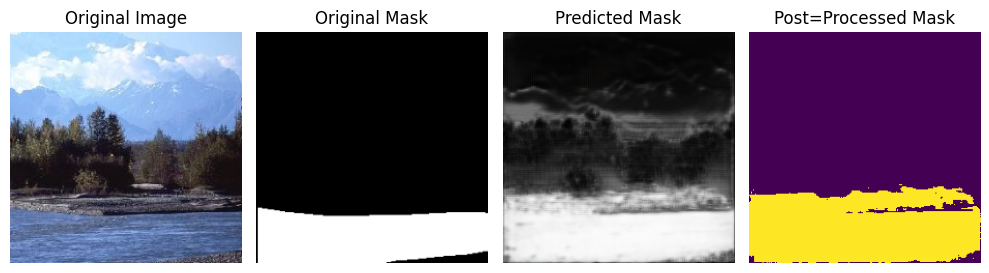

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


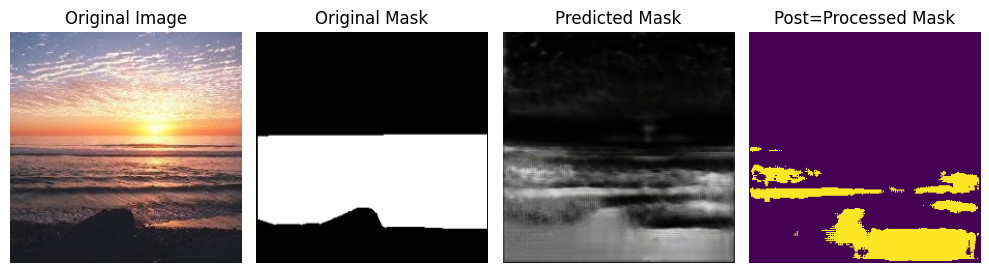

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


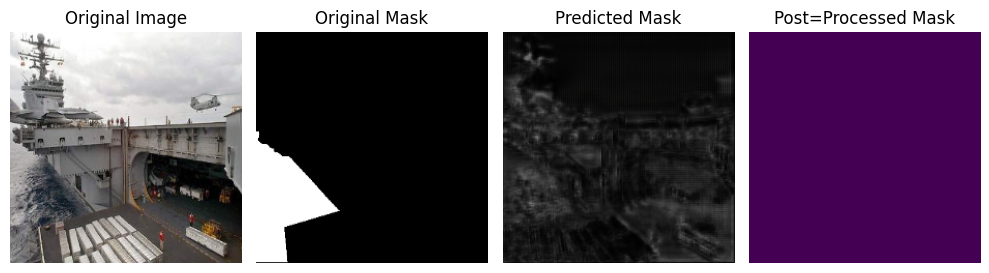

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


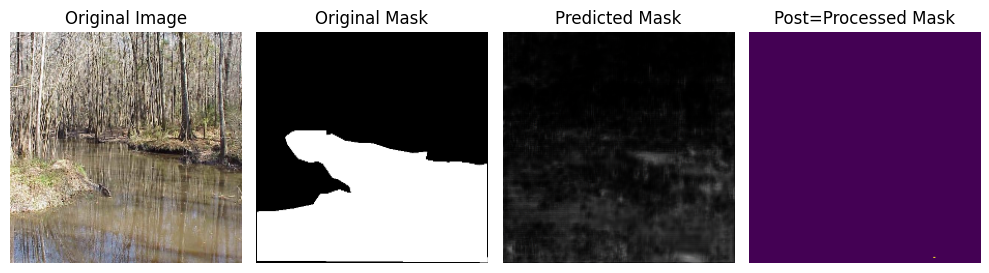

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


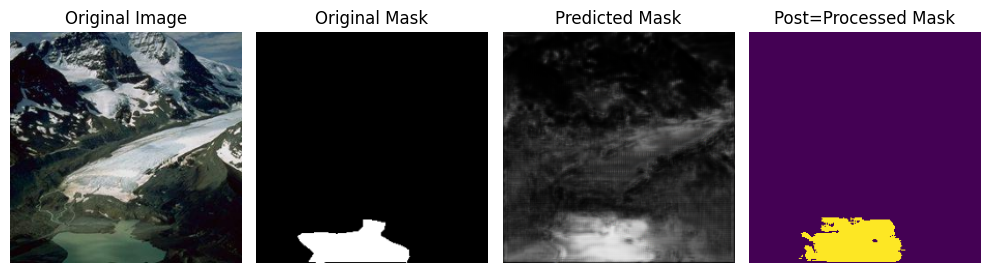

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


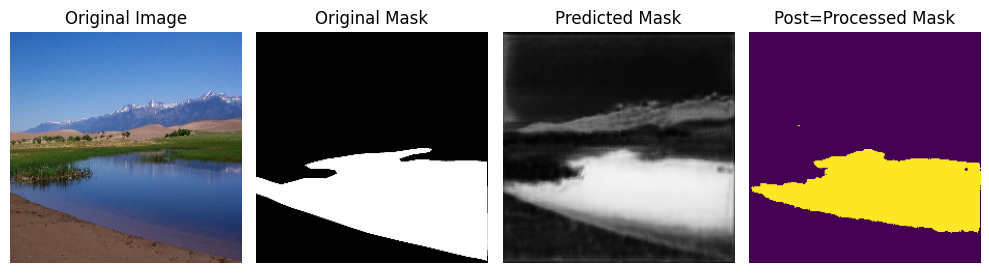

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


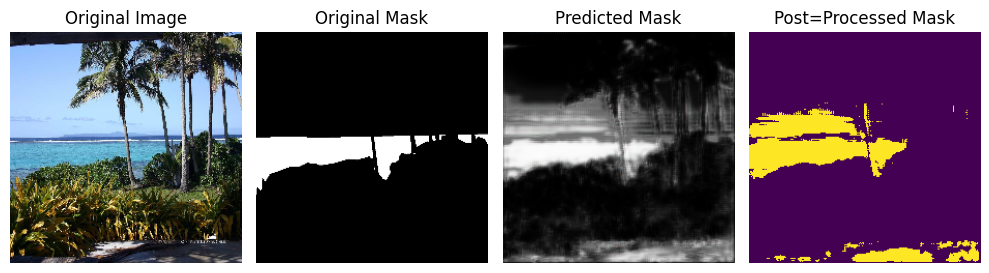

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


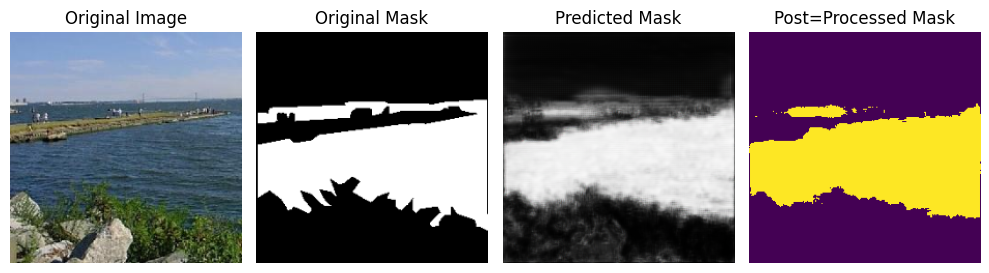

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


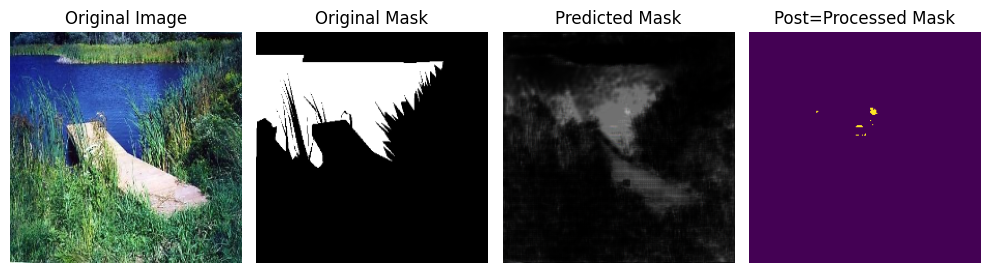

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


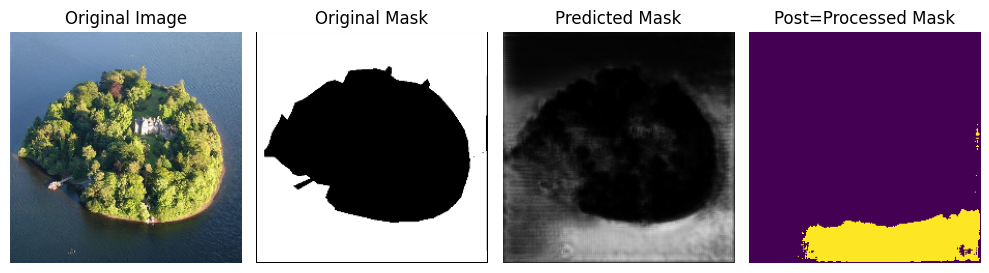

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


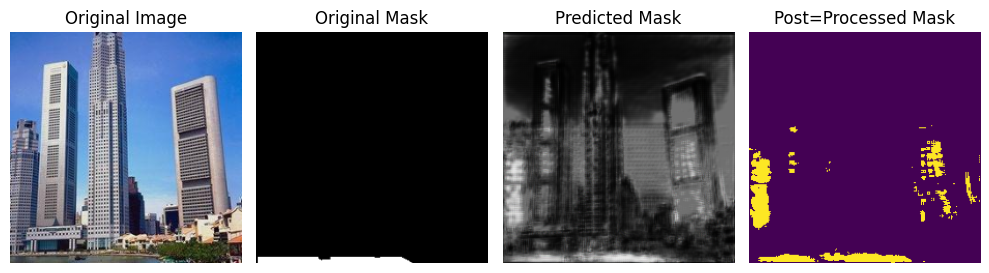

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


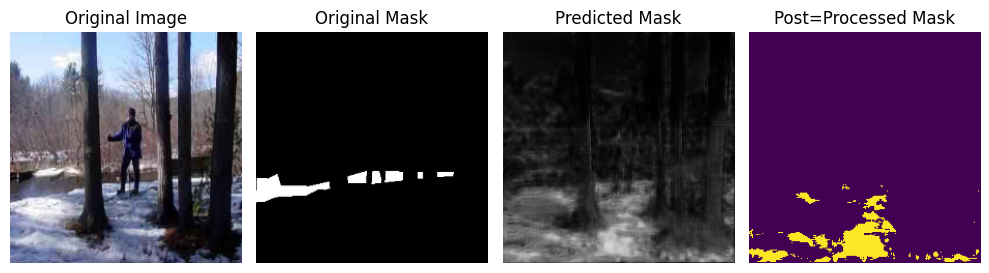

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


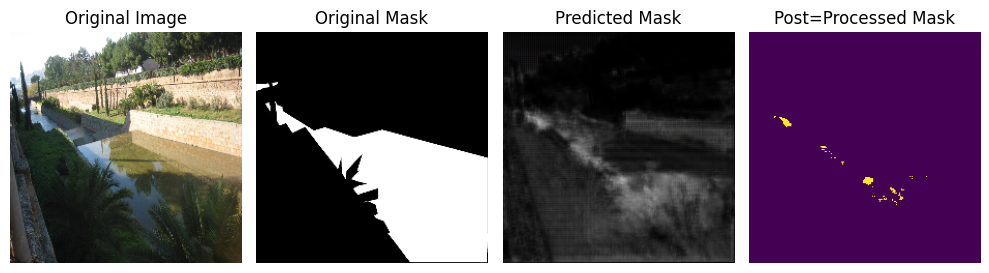

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


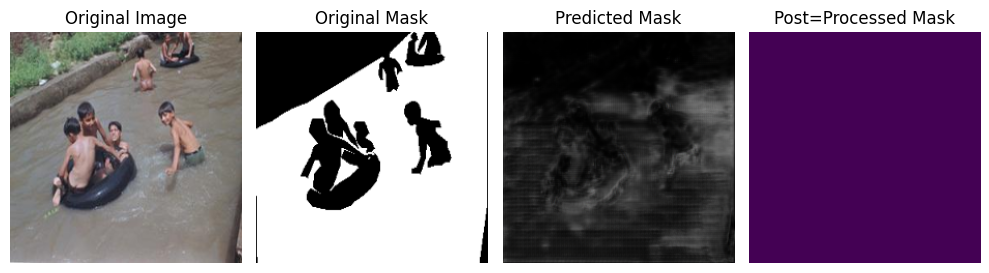

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


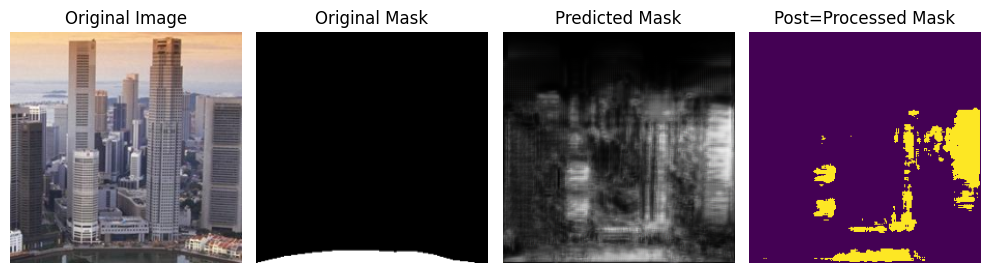

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


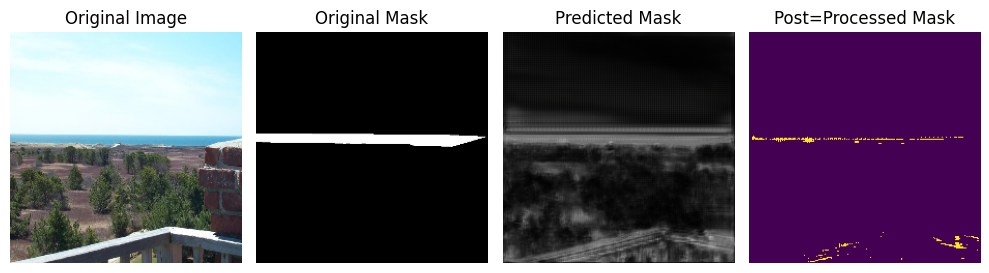

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


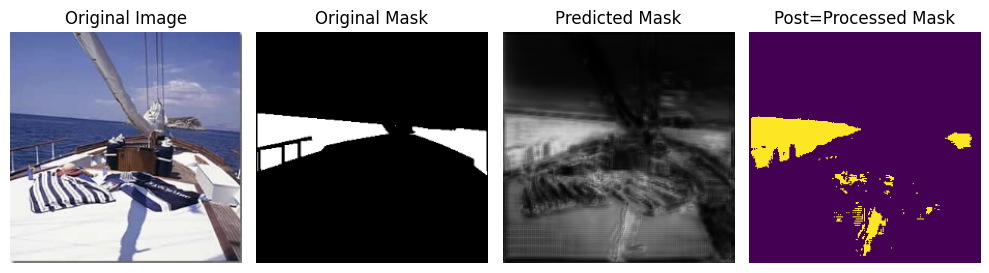

In [21]:
for i in range(20):
    id = randint(len(X_val))
    image = X_val[id]
    mask = y_val[id]
    pred_mask = UNet.predict(tf.expand_dims(image,axis=0))[0]
    post_process = (pred_mask[:,:,0] > 0.5).astype('int')

    plt.figure(figsize=(10,8))
    plt.subplot(1,4,1)
    show_image(image, title="Original Image")

    plt.subplot(1,4,2)
    show_image(mask, title="Original Mask")

    plt.subplot(1,4,3)
    show_image(pred_mask, title="Predicted Mask")

    plt.subplot(1,4,4)
    show_image(post_process, title="Post=Processed Mask")


    plt.tight_layout()
    plt.show()

In [57]:
my_image_path="/content/drive/MyDrive/Earthwatch_project/water_v2/Our_images"
total_images = len(os.listdir(my_image_path))
print(f"Total Number of Images : {total_images}")
my_paths=sorted(glob(my_image_path + "/*.jpg"))
print(len(my_paths))
X_values, y_values = load_data(my_paths)

Total Number of Images : 3
3


Loading: 3it [00:00, 15.21it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


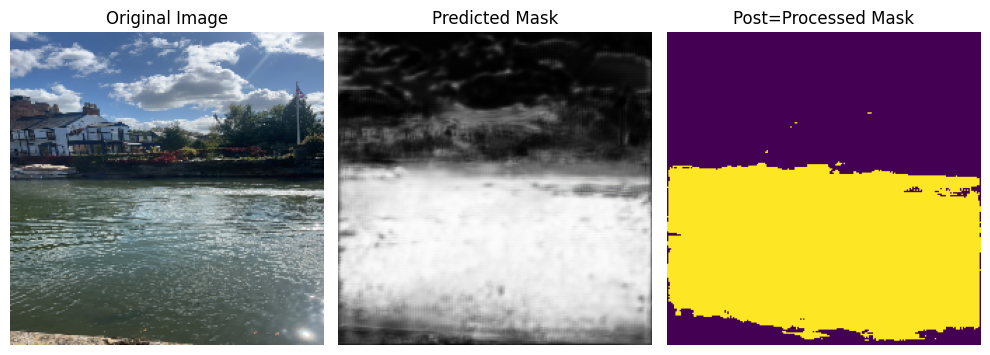

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


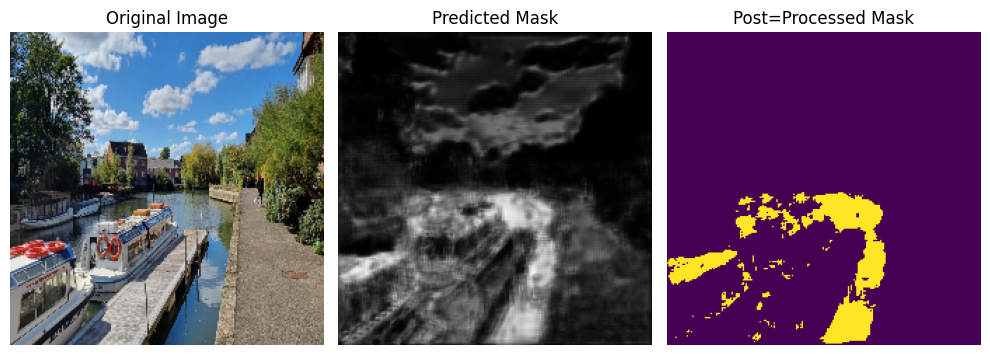

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


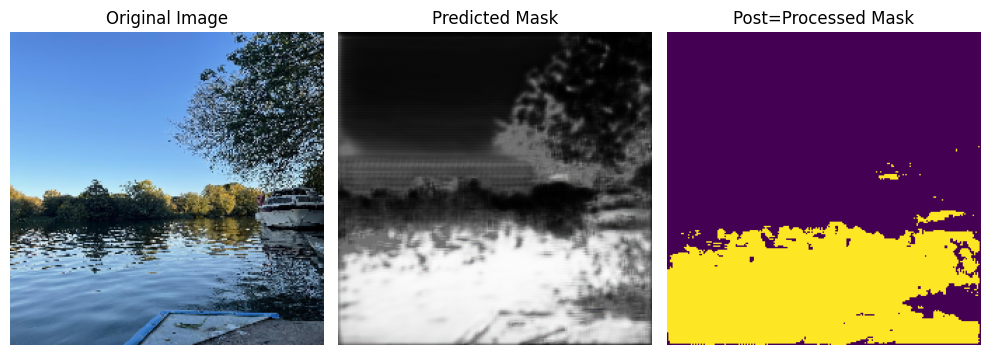

In [59]:
for i in range(3):
    id = i
    image = X_values[id]

    mask = y_values[id]
    pred_mask = UNet.predict(tf.expand_dims(image,axis=0))[0]
    post_process = (pred_mask[:,:,0] > 0.5).astype('int')

    plt.figure(figsize=(10,8))
    plt.subplot(1,3,1)
    show_image(image, title="Original Image")

    #plt.subplot(1,3,2)
    #show_image(mask, title="Original Mask")

    plt.subplot(1,3,2)
    show_image(pred_mask, title="Predicted Mask")

    plt.subplot(1,3,3)
    show_image(post_process, title="Post=Processed Mask")


    plt.tight_layout()
    plt.show()